In [1]:
%pip install leafmap
%pip install rasterio
%pip install localtileserver # Need to visualize a rather large  raster?
%pip install segment-geospatial
%pip install rioxarray

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.7/213.7 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 22.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 727.4/727.4 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.9/182.9 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.4/72.4 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 48.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.5/263.5 k

In [2]:
import leafmap
import rasterio
import os
from samgeo import SamGeo, tms_to_geotiff

The image should has no more than three bands.

In [3]:
url = "https://drive.google.com/file/d/1W4VYYYxRioYtJvVRIMzqO0mVV4lJdUGa/view?usp=sharing"
leafmap.download_file(url, output="image.tif", overwrite=True)

Downloading...
From (original): https://drive.google.com/uc?id=1W4VYYYxRioYtJvVRIMzqO0mVV4lJdUGa
From (redirected): https://drive.google.com/uc?id=1W4VYYYxRioYtJvVRIMzqO0mVV4lJdUGa&confirm=t&uuid=f776ab41-d71c-41ce-8315-0613a3d04143
To: /content/image.tif
100%|██████████| 671M/671M [00:11<00:00, 58.5MB/s]


'/content/image.tif'

In [4]:
m = leafmap.Map( #height="600px"
                )
m.add_basemap("SATELLITE")
m.add_raster("image.tif", layer_name="Image")
#m.add_layer_manager()
m

Map(center=[43.1238775, -116.78767400000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [ ]:
sam = SamGeo(
    model_type="vit_h",
   # automatic=False,
    sam_kwargs=None,
)

In [ ]:
image="/content/image.tif"
sam.set_image(image)

AttributeError: 'SamGeo' object has no attribute 'predictor'

In [5]:
import torch
torch.cuda.empty_cache() # Release all unoccupied cached memory currently held by the caching allocator so that those can be used in other GPU application and visible in nvidia-smi.

In [6]:
sam_kwargs = {
    "points_per_side": 16,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 80,
}

sam = SamGeo(
    model_type="vit_h",
    #model_type="vit_b",
    sam_kwargs=sam_kwargs,
)

#image="/content/image.tif"
#sam.set_image(image)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [01:16<00:00, 33.5MB/s]


In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=None,
)

Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth


Model checkpoint for vit_h not found.


100%|██████████| 2.56G/2.56G [00:15<00:00, 170MB/s]


In [8]:
import datetime
current_time = datetime.datetime.now()

sam.generate("image.tif", output="mask.tif", foreground=True)
#sam.generate("image.tif", output="mask.tif", unique=True, foreground=True, batch=True, batch_sample_size= (576, 576) )
end_time = datetime.datetime.now()
print(   current_time.minute- end_time.minute )

error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
m =sam.generate("image.tif", output="mask.tif", foreground=True)
print(type(m))

<class 'NoneType'>


In [ ]:
sam.show_masks( #cmap="binary_r"
               )

NameError: name 'sam' is not defined

In [ ]:
sam.tiff_to_vector( "mask.tif", "mask.gpkg")

In [ ]:
from google.colab import files




gpkg_path = '/content/mask.gpkg'



files.download(gpkg_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

TypeError: string indices must be integers

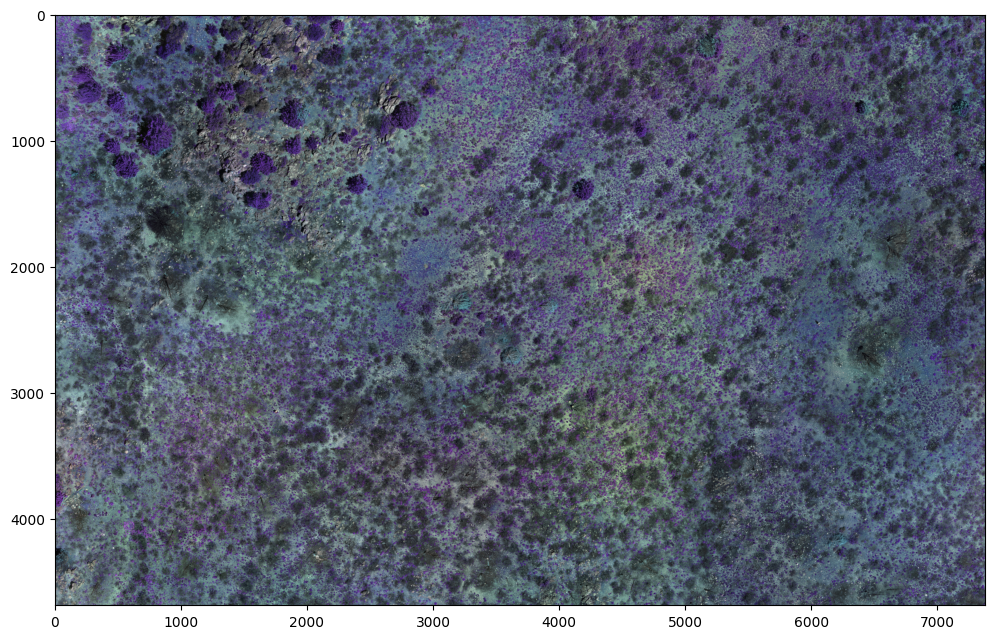

In [ ]:
sam.show_anns(axis="off", alpha=1, output="annotations.tif")

In [ ]:
sam.tiff_to_vector("annotations.tif", "annotations.shp")

sam.tiff_to_vector( "annotations.tif", "annotations.gpkg")

In [ ]:
from google.colab import files

# Specify the file path
shp_path = '/content/annotations.shp'
shx_path = '/content/annotations.shx'
dbf_path = '/content/annotations.dbf'
prj_path = '/content/annotations.prj'
cpg_path = '/content/annotations.cpg'

gpkg_path = '/content/annotations.gpkg'

# Download the file
files.download(shp_path)
files.download(shx_path)
files.download(dbf_path)
files.download(prj_path)
files.download(cpg_path)
files.download(gpkg_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os
print(os.listdir('/content'))

['.config', 'annotations.shp', 'annotations.cpg', 'annotations.shx', 'mask.tif', 'annotations.dbf', 'annotations.tif', 'annotations.prj', 'annotations.gpkg', 'image.tif', 'sample_data']


In [ ]:
#m.add_raster("mask.tif", layer_name="Mask", cmap="terrain" # , cmap="Blues", nodata=0 , opacity=1             )
m.add_raster("annotations.tif", layer_name="annotations"#, cmap="terrain" # , cmap="Blues", nodata=0 , opacity=1
             )
m

Map(bottom=98507744.0, center=[43.126369999999994, -116.7855965], controls=(ZoomControl(options=['position', '…


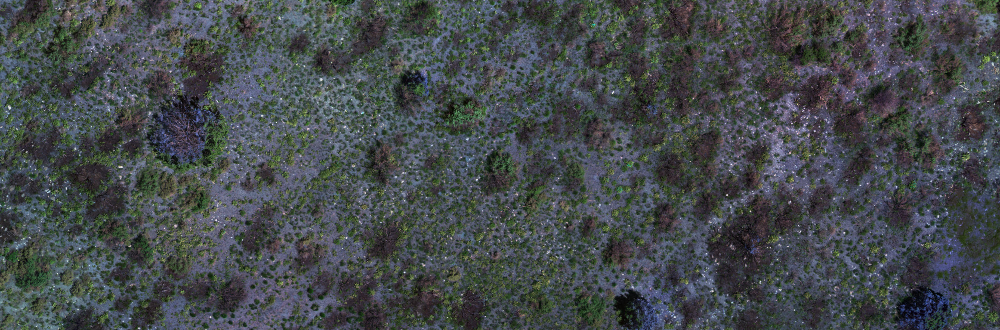
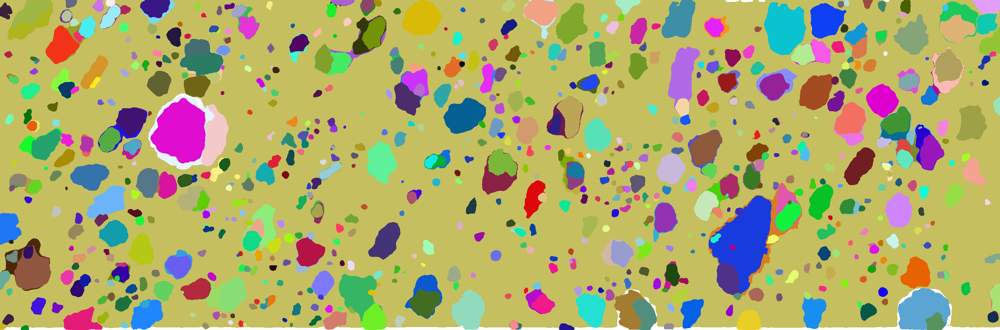

In [ ]:
leafmap.image_comparison(
    image,
    "annotations.tif",


    label1="Image",
    label2="Image Segmentation",
)